# Image Capture using VGG16 + Attention #

## Data ##
In google My Drive I have:

- Flickr8k_Dataset.zip
- Flickr8k_text.zip
- glove.6B.zip

##InceptionV3##
This is based on https://towardsdatascience.com/image-captioning-with-keras-teaching-computers-to-describe-pictures-c88a46a311b8 


##VGG16 + Attention##

Code has been adapated from online blog:
https://github.com/SubhamIO/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/blob/master/Image_Captioning_using_Attention_Mechanism.ipynb

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print(tf.__version__)

2.2.0


In [1]:
!ls -a '/root/.keras/datasets/'

ls: cannot access '/root/.keras/datasets/': No such file or directory


# Mounting the Drive
Zipped image and text files are stored in Google My Drive, so first the drive is mounted and then the files are downloaded, accessible in /root/.keras/datasets/

In [1]:
%tensorflow_version 2.x
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
# Python Libraries
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
import pickle #import dump, load
from time import time
import tensorflow as tf

from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, Concatenate, Dropout, BatchNormalization, add, Add
from tensorflow.keras.layers import Conv2D, MaxPool2D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.optimizers import Adam, RMSprop
#from tensorflow.keras.applications.inception_v3 import InceptionV3
#from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.backend.tensorflow_backend import set_session, repeat_elements

from collections import Counter 
import seaborn as sns
import sys, os, warnings 
import re
from pickle import load
from pickle import dump
import datetime

# Scikit-learn includes many helpful utilities
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
# Read the Images to Keras/datasets
import tensorflow as tf
file_url = 'file:///content/drive/My Drive/Flickr8k_Dataset.zip'
zip_dir = tf.keras.utils.get_file('Flickr8k_Dataset.zip', origin=file_url, extract=True)
print(zip_dir)

# Read the Text files
file_url = 'file:///content/drive/My Drive/Flickr8k_text.zip'
txt_dir = tf.keras.utils.get_file('Flickr8k_text.zip', origin=file_url, extract=True)
print(txt_dir)

# Read the Text files
file_url = 'file:///content/drive/My Drive/glove.6B.zip'
glv_dir = tf.keras.utils.get_file('glove.6B.zip', origin=file_url, extract=True)
print(glv_dir)

1115422720/1115419746 [==============================] - 25s 0us/step
/root/.keras/datasets/Flickr8k_Dataset.zip
2342912/2340801 [==============================] - 1s 0us/step
/root/.keras/datasets/Flickr8k_text.zip
862183424/862182613 [==============================] - 44s 0us/step
/root/.keras/datasets/glove.6B.zip


##**Utility Functions to load and clean data**

In [4]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# To remove punctuations
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)

# To remove single characters
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# To remove numeric values
def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

## The location of the Flickr8K_ photos
root_directory = '/root/.keras/datasets/'
image_dir = root_directory + 'Flicker8k_Dataset'
images = os.listdir(image_dir)

## The location of the caption file
descriptions_dir = root_directory + 'Flickr8k.token.txt'

print("The number of jpg flies in Flicker8k: {}".format(len(images)))

The number of jpg flies in Flicker8k: 8091


##**Functions for assisting with EDA**

- Making a dataframe out of raw text
- File information


In [5]:
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split('\t')
      if len(splitted) == 1:
          continue
      w = splitted[0].split("#")
      df.append(w + [splitted[1].lower()])
  return df

# If any filename dosn't have .jpg extension at last then mark it as Invalid filename
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

# read in the Flickr caption data
text = load_doc(descriptions_dir)
# print(text[:325])
df = make_dataset(text)  

data = pd.DataFrame(df,columns=["filename","index","caption"])
# Reordering columns for better readability
data = data.reindex(columns =['index','filename','caption'])

# Remove rows with invalid filename
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']

unique_filenames = utility_counter(data)  

print(data)

The number of unique file names : 8091
We can see that all the keys are having values count = 5
Counter({'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5, '1003163366_44323f5815.jpg': 5, '1007129816_e794419615.jpg': 5, '1007320043_627395c3d8.jpg': 5, '1009434119_febe49276a.jpg': 5, '1012212859_01547e3f17.jpg': 5, '1015118661_980735411b.jpg': 5, '1015584366_dfcec3c85a.jpg': 5, '101654506_8eb26cfb60.jpg': 5, '101669240_b2d3e7f17b.jpg': 5, '1016887272_03199f49c4.jpg': 5, '1019077836_6fc9b15408.jpg': 5, '1019604187_d087bf9a5f.jpg': 5, '1020651753_06077ec457.jpg': 5, '1022454332_6af2c1449a.jpg': 5, '1022454428_b6b660a67b.jpg': 5, '1022975728_75515238d8.jpg': 5, '102351840_323e3de834.jpg': 5, '1024138940_f1fefbdce1.jpg': 5, '102455176_5f8ead62d5.jpg': 5, '1026685415_0431cbf574.jpg': 5, '1028205764_7e8df9a2ea.jpg': 5, '1030985833_b0902ea560.jpg': 5, '103106960_e8a41d64f8.jpg': 5, '103195344_5d2dc613a3.jpg': 5, '103205630_682ca7285b.jpg': 5, '10321

##**Preprocess Images**##

In [6]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir+"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector

all_img_name_vector = preprocess_images(data)
all_img_name_vector[:3]

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg']

In [7]:
def preprocess_captions(data):
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions

total_captions = preprocess_captions(data)
total_captions[:3]

['<start> a child in a pink dress is climbing up a set of stairs in an entry way . <end>',
 '<start> a girl going into a wooden building . <end>',
 '<start> a little girl climbing into a wooden playhouse . <end>']

In [8]:
def data_limiter(num,total_captions,all_img_name_vector):
  # Shuffle captions and image_names together
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  #train_captions = train_captions[:num]
  #img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

train_captions,img_name_vector = data_limiter(40000,total_captions,all_img_name_vector)

print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40455 , Total images = 40455


###**Since we are using pre-trained model VGG16, images must be resized to (224, 224, 3)**

In [0]:
# Resizing of images
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (224, 224, 3)


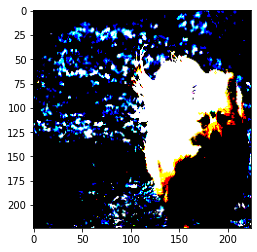

In [11]:
img1,img1_path = load_image(image_dir + '/3439243433_d5f3508612.jpg')
print("Shape after resize :", img1.shape)
plt.imshow(img1)

###**Functions for Image Augmentation**

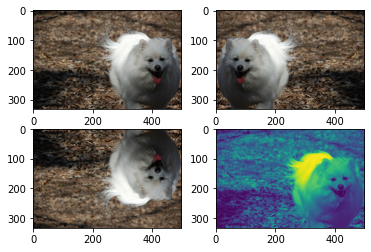

In [10]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper(image_dir + '/' + '3439243433_d5f3508612.jpg')

##**Image Histograms**
- Histogram is considered as a graph or plot which is related to frequency of pixels in an Gray Scale Image with pixel values (ranging from 0 to 255). 
- Grayscale image is an image in which the value of each pixel is a single sample, that is, it carries only intensity information where pixel value varies from 0 to 255

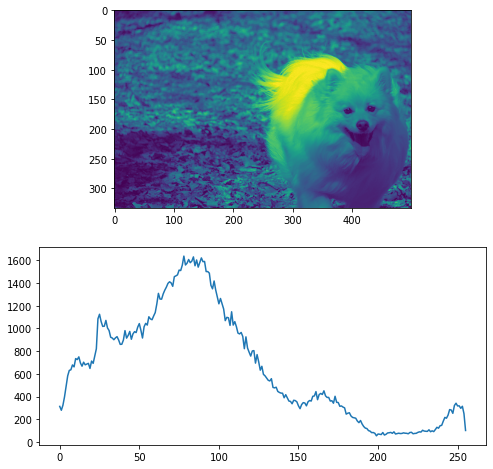

In [23]:
# importing required libraries of opencv 
import cv2 
# importing library for plotting 
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  # reads an input image 
  img = cv2.imread(image,0) 
  # find frequency of pixels in range 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms(image_dir + '/' + '3439243433_d5f3508612.jpg')

##**Pre-Trained Image Model (VGG16)**##
The following creates an instance of the VGG16 model using the Keras API. This automatically downloads the required files if you don't have them already.

The VGG16 model was pre-trained on the ImageNet data-set for classifying images. The VGG16 model contains a convolutional part and a fully-connected (or dense) part which is used for the image classification.

If include_top=True then the whole VGG16 model is downloaded which is about 528 MB. If include_top=False then only the convolutional part of the VGG16 model is downloaded which is just 57 MB.

We will use some of the fully-connected layers in this pre-trained model, so we have to download the full model, but if you have a slow internet connection, then you can try and modify the code below to use the smaller pre-trained model without the classification layers.

In [12]:
# Pre-Trained Image Model (VGG16)
image_model = tf.keras.applications.VGG16(include_top=False,weights='imagenet')
new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

image_features_extract_model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
______________________________________________________________

##**Features extractraction from VGG16**

In [13]:
# Get unique images
encode_train = sorted(set(img_name_vector))

print(encode_train[:10])

image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)

# Feel free to change batch_size according to your system configuration
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

image_dataset

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1003163366_44323f5815.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007129816_e794419615.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007320043_627395c3d8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1009434119_febe49276a.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1012212859_01547e3f17.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1015118661_980735411b.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1015584366_dfcec3c85a.jpg']


<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.string)>

##**NumPy array file**
An NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [0]:
from tqdm import tqdm

for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

##**Data Preparation for a Language Generation(RNN) DECODER**
1. We will perform a few basic pre-processing steps on the captions such as:
First, we will tokenize the captions. This will help us to build a vocabulary of all the unique words in the data.
2. Next, we will limit the vocabulary size to top 5000 words to save memory. We will replace all the other words with the token < unk > (for words not in vocabulary) . You , can obviously optimize that according to the use cases.
3. Finally, we will create a word->index mapping and vice versa.
4. We will pad all sequences to be the same length as the longest one.

In [0]:
def tokenize_caption(top_k,train_captions):
  # Choose the top 5000 words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    oov_token="<unk>",
                                                    filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'

  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(5000,train_captions)

In [16]:
train_captions[:3]

['<start> several children leaping into a pile of leaves on the ground . <end>',
 '<start> a man hiking in the wilderness giving the camera a thumbs up . <end>',
 '<start> a white dog is running through the water onto the shore . <end>']

In [17]:
train_seqs[:3]

[[3, 186, 63, 337, 65, 2, 521, 13, 333, 7, 6, 171, 4],
 [3, 2, 12, 595, 5, 6, 2438, 915, 6, 93, 2, 1194, 52, 4],
 [3, 2, 15, 10, 8, 33, 34, 6, 25, 241, 6, 287, 4]]

**MaxLength and MinLength of any captions**

In [18]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 39 : 3


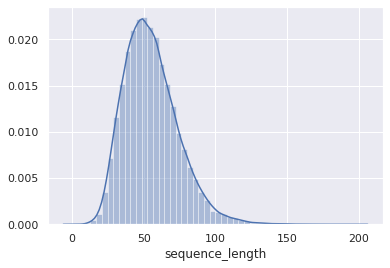

In [19]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

###**Pad each vector to the max_length of the captions, so that all caption vectors are of same length**###

In [22]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post') 

padded_caption_vector

array([[   3,  186,   63, ...,    0,    0,    0],
       [   3,    2,   12, ...,    0,    0,    0],
       [   3,    2,   15, ...,    0,    0,    0],
       ...,
       [   3,    2,   10, ...,    0,    0,    0],
       [   3,    2,   10, ...,    0,    0,    0],
       [   3,    2, 3248, ...,    0,    0,    0]], dtype=int32)

###**Train-Test Split (80:20)**###

In [23]:
# Create training and test set using an 80-20 split
img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,padded_caption_vector,test_size=0.2,random_state=0)

print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("Test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 32364,Y = 32364
Test Data : X = 8091,Y = 8091


In [0]:
# Create training and test set using an 80-20 split
#img_name_train = img_name_vector
#img_name_test = img_name_vector_val
 
#caption_train = padded_caption_vector
#caption_test = padded_caption_vector_val

###**Creating the datasets**###

In [0]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1     #8329
num_steps = len(img_name_train) // BATCH_SIZE  #500
EPOCHS = 2

# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 512
attention_features_shape = 49

def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_train,caption_train):
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

# Creating train and test dataset
dataset = create_dataset(img_name_train,caption_train)
test_dataset = create_dataset(img_name_test,caption_test) 


###**CNN ENCODER:**###
Now, let's define the CNN ENCODER, that will be the single fully connected layer followed by ReLU activation.

In [0]:
# https://www.tensorflow.org/tutorials/text/image_captioning
class VGG16_Encoder(tf.keras.Model):
    # This encoder passes the features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        #self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [0]:
def rnn_type(units):
  # If you have a GPU, we recommend using CuDNNGRU(provides a 3x speedup than GRU)
  # the code automatically does that.
    if tf.config.list_physical_devices('GPU'):
        return tf.compat.v1.keras.layers.CuDNNLSTM(units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                                   return_sequences=True, 
                                   return_state=True, 
                                   recurrent_activation='sigmoid', 
                                   recurrent_initializer='glorot_uniform')

###**RNN DECODER and BAHDANAU ATTENTION(LOCAL ATTENTION) MECHANISM:**
In the RNN Decoder we will also define the Attention Mechanism. We will need the features from the CNN ENCODER . This Attention Mechanism will return the context vector and attention weights over the time axis.

In [0]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and 
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [0]:
#if(attention_choice=='local'):
encoder = VGG16_Encoder(embedding_dim)
decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

In [0]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

###**Saving Checkpoint**
- TensorFlow objects provide an easy automatic mechanism for saving and restoring the values of variables they use.
- All prefixes are grouped together in a single checkpoint file ('./tf_ckpts/checkpoint') where the CheckpointManager saves its state.

In [0]:
checkpoint_path_ckpt = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

##**Training Step:**
- The ENCODER output, hidden state(initialised to 0) and the DECODER input(which is the < start > token) are passed to the DECODER.
- The DECODER returns the predictions and the DECODER hidden state.
- The DECODER hidden state is then passed back into the model and the predictions are used to calculate the loss. While training, we use the Teacher Forcing technique, to decide the next input of the DECODER.
- Teacher Forcing is the technique where the target word is passed as the next input to the DECODER. This technique helps to learn the correct sequence or correct statistical properties fro the sequence, quickly.
- Final step is to calculate the Gradient and apply it to the optimizer and backpropagate


###**Setup Tensorboard summary writer**###

In [0]:
# Clear previous logs
!rm -rf ./logs/

In [0]:
# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []
test_loss_plot = []

In [0]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)  #* BATCH_SIZE

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          
  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [0]:
@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)  #* BATCH_SIZE  target.shape[0]

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder
     
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      # predictions : (64,8329)
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*target.shape[0], 1)
 
  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

##**Training**

In [39]:
# TRAINING
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss

        if batch % 250 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
            
    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train / num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss

        if batch % 250 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))

    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time() - start))


Epoch 1 Batch 0 Loss 2.5619
Epoch 1 Batch 250 Loss 1.1143
Epoch 1 Batch 500 Loss 0.9717
Epoch 1 Batch 0 Loss 1.7248
Epoch 1 TrainLoss 1.278499 TestLoss 0.473790
Time taken for 1 epoch 148.935560464859 sec

Epoch 2 Batch 0 Loss 1.0938
Epoch 2 Batch 250 Loss 0.8392
Epoch 2 Batch 500 Loss 0.9560
Epoch 2 Batch 0 Loss 2.1532
Epoch 2 TrainLoss 0.982788 TestLoss 0.477955
Time taken for 1 epoch 80.40819692611694 sec

Epoch 3 Batch 0 Loss 0.8815
Epoch 3 Batch 250 Loss 0.9517
Epoch 3 Batch 500 Loss 0.8350
Epoch 3 Batch 0 Loss 2.0145
Epoch 3 TrainLoss 0.881682 TestLoss 0.491954
Time taken for 1 epoch 81.47050476074219 sec

Epoch 4 Batch 0 Loss 0.7680
Epoch 4 Batch 250 Loss 0.7838
Epoch 4 Batch 500 Loss 0.7264
Epoch 4 Batch 0 Loss 2.1030
Epoch 4 TrainLoss 0.810675 TestLoss 0.500345
Time taken for 1 epoch 81.8405454158783 sec

Epoch 5 Batch 0 Loss 0.7140
Epoch 5 Batch 250 Loss 0.8012
Epoch 5 Batch 500 Loss 0.6514
Epoch 5 Batch 0 Loss 2.1303
Epoch 5 TrainLoss 0.753405 TestLoss 0.502605
Time taken fo

In [40]:
# Launching Tensorboard
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

<IPython.core.display.Javascript object>

In [41]:
ckpt_manager.checkpoints

['./checkpoints/train/ckpt-1',
 './checkpoints/train/ckpt-2',
 './checkpoints/train/ckpt-3',
 './checkpoints/train/ckpt-4']

In [42]:
ckpt.restore('./checkpoints/train/ckpt-4')

No handles with labels found to put in legend.


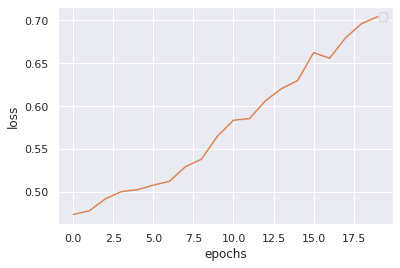

In [43]:
# Plot the Train and Validation Losses to check for overfitting
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

##**Evaluating the Captioning Model**##
- The evaluate function is similar to the training loop, except we don't use Teacher Forcing here. The input to Decoder at each time step is its previous predictions, along with the hidden state and the ENCODER output.
- Few key points to remember while making predictions.
1. Stop predicting when the model predicts the end token.
2. Store the attention weights for every time step.

In [0]:
# Greedy Approach
def evaluate_greedy(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []     # need for plot_attention()
    result_cap = '' # required for BLUE assessment

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        # next line necessary for plot_attention()
        result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted
        # next line necessary for BLUE caption assessment
        result_cap = result_cap + ' ' + tokenizer.index_word[predicted_id]
        
        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot, result_cap

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot, result_cap


In [0]:
# Beam Search
def evaluate_beam(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot

In [0]:
# Let's create a helper function to visualise the attention points that predicts the words.
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

###**Prediction and Evaluation Function for both Evaluation types: greedy & beam**##

In [0]:
# 1) Let's checkout few captions generated using Greedy Search vs Beam Search
# test image = '3445428367_25bafffe75.jpg' => black dog is digging in the snow
# test rid = 5994 => the blond girl is jumping up in the air

from PIL import Image
from nltk.translate.bleu_score import sentence_bleu
import re
warnings.filterwarnings("ignore")

def image_cap_predict(eval_type='greedy', beam_index=5, rid=5994, image='413231421_43833a11f5.jpg'):

    if rid==5994 and image=='413231421_43833a11f5.jpg':
      # pick random id, as no image id or name passed
      rid = np.random.randint(0, len(img_name_test))
      image = img_name_test[rid]
    elif rid!=5994:
      # use image id passed in   
      image = img_name_test[rid]
    else:
      # use image name passed in
      image = image_dir + '/' + image

    print(image)
    start = time()
    real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
    result_cap = ''

    if eval_type == 'greedy':
      # Greedy evaluation method
      result, attention_plot, result_cap = evaluate_greedy(image)
    else:
      result, attention_plot = evaluate_beam(image, beam_index)

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove "<end>" in result_cap
    result_cap = re.sub('<end>', '', result_cap)

    #remove <end> from result         
    result_join = ''.join(str(result))
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    print(f'Evaulation method   : {eval_type}')
    print ('Real Caption        :', real_caption)

    if eval_type=='greedy':
      score = sentence_bleu(real_caption, result_cap.strip(), weights=(0.5, 0.5, 0, 0))
      print('Prediction Caption  :', result_cap.strip())
    else:
      score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
      print(f'Prediction Caption  :', result_final)

    print(f"BELU score          : {score*100}")
    print(f"time took to Predict: {round(time()-start)} sec")
    print(f'image id            : {rid}')

    plot_attention(image, result, attention_plot)

    return image, rid


/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
Evaulation method: greedy
Real Caption        : a little dog chews on a big stick
Prediction Caption  : a large brown dog shaking its nose
BELU score          : 66.42111641550714
time took to Predict: 0 sec
image id: 6542


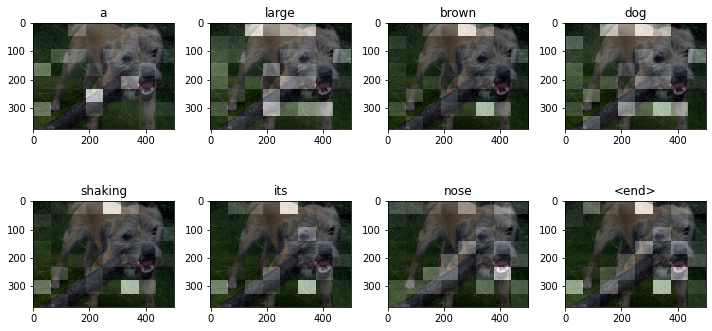

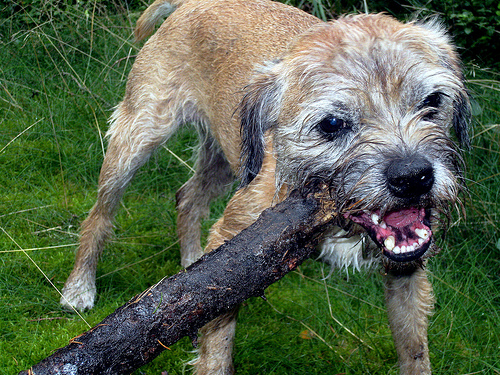

In [154]:
# TEST 1.A - GREEDY
image, rid = image_cap_predict(eval_type='greedy', rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
Evaulation method   : beam
Real Caption        : a little dog chews on a big stick
Prediction Caption  : a large dog who is carrying a
BELU score          : 56.75047991270782
time took to Predict: 3 sec
image id            : 6542


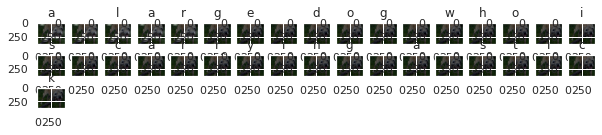

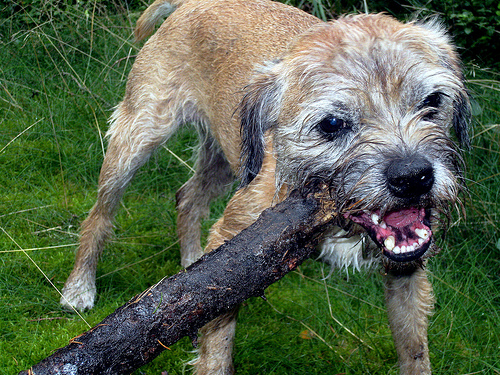

In [49]:
# TEST 1.B - BEAM (3)
image, rid = image_cap_predict(eval_type='beam', beam_index=5, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
Evaulation method   : beam
Real Caption        : a little dog chews on a big stick
Prediction Caption  : small white dog who is carrying a
BELU score          : 46.33657281473354
time took to Predict: 4 sec
image id            : 6542


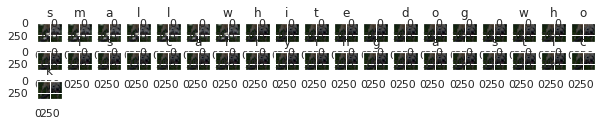

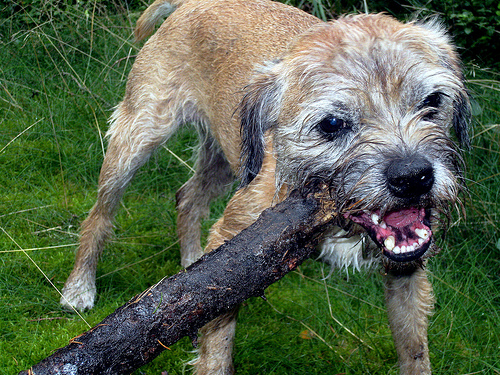

In [50]:
# TEST 1.C - BEAM (7)
image, rid = image_cap_predict(eval_type='beam', beam_index=7, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
Evaulation method   : beam
Real Caption        : a little dog chews on a big stick
Prediction Caption  : a yellow dog who is carrying a
BELU score          : 56.75047991270782
time took to Predict: 9 sec
image id            : 6542


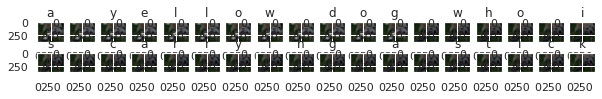

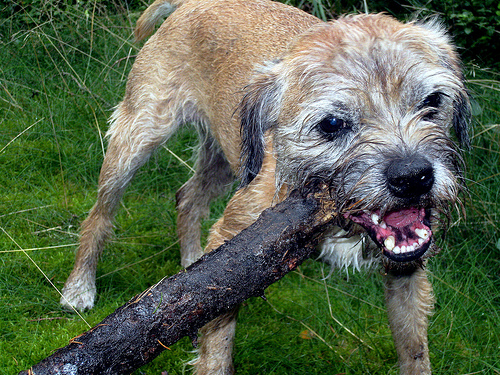

In [51]:
# TEST 1.D - BEAM (12)
image, rid = image_cap_predict(eval_type='beam', beam_index=12, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
Evaulation method   : greedy
Real Caption        : snow covered wooded area with a structure and a person in white top and orange pants in midair
Prediction Caption  : a skier getting ready to the snow covered hill
BELU score          : 57.10402407201607
time took to Predict: 0 sec
image id            : 5397


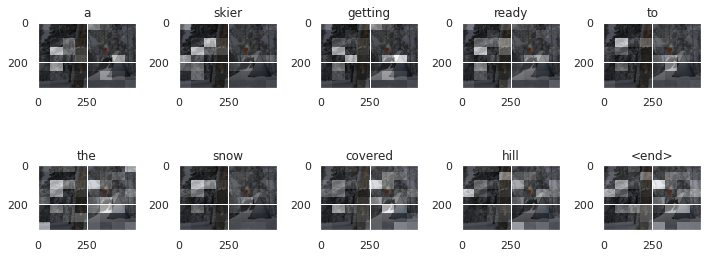

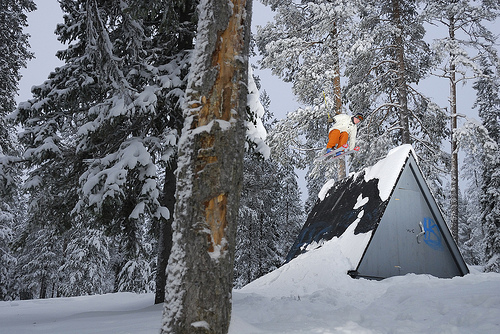

In [52]:
# TEST 2.A - BEAM (12)
image, rid = image_cap_predict(eval_type='greedy', rid=5397)
# opening the image, does not work inside the function
Image.open(image)

Test 2B - Beam=3
/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
Evaulation method   : beam
Real Caption        : snow covered wooded area with a structure and a person in white top and orange pants in midair
Prediction Caption  : a harness jumps ready
BELU score          : 1.5098691711159251
time took to Predict: 1 sec
image id            : 5397


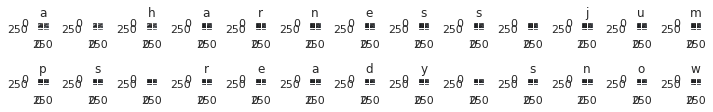

Test 2C - Beam=6
/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
Evaulation method   : beam
Real Caption        : snow covered wooded area with a structure and a person in white top and orange pants in midair
Prediction Caption  : a
BELU score          : 4.139937718785167e-06
time took to Predict: 3 sec
image id            : 5397


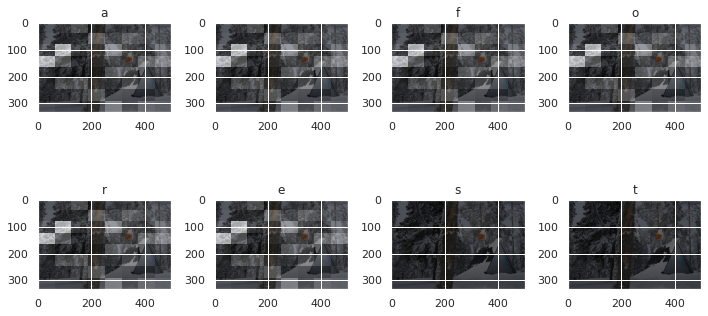

Test 2D - Beam=10
/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
Evaulation method   : beam
Real Caption        : snow covered wooded area with a structure and a person in white top and orange pants in midair
Prediction Caption  : a
BELU score          : 4.139937718785167e-06
time took to Predict: 7 sec
image id            : 5397


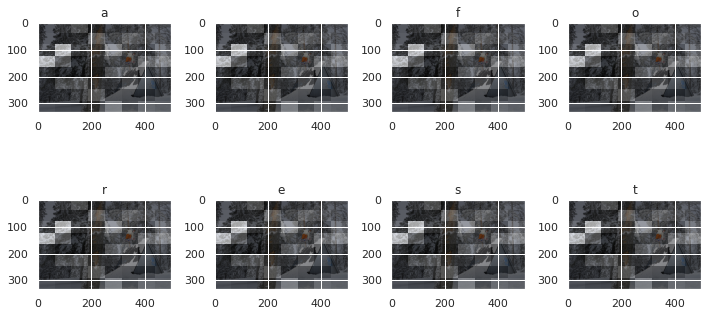

In [61]:
# TEST 2.B-D - BEAM 
print('Test 2B - Beam=3')
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=5397)

print('Test 2C - Beam=6')
image, rid = image_cap_predict(eval_type='beam', beam_index=6, rid=5397)

print('Test 2D - Beam=10')
image, rid = image_cap_predict(eval_type='beam', beam_index=10, rid=5397)

Test 3A - Greedy
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
Evaulation method   : greedy
Real Caption        : three kids <unk> with a toy cat in a garden
Prediction Caption  : two girls in a field of mouth
BELU score          : 69.48083337796513
time took to Predict: 0 sec
image id            : 2966


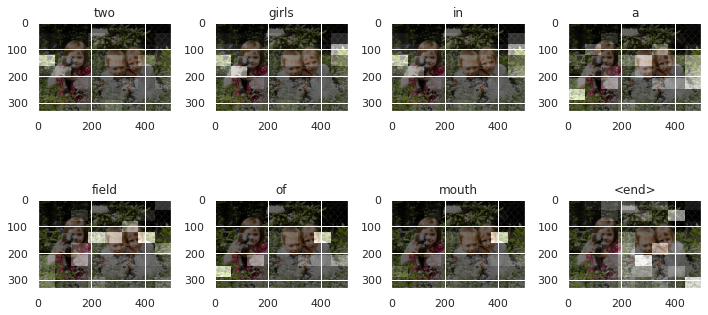

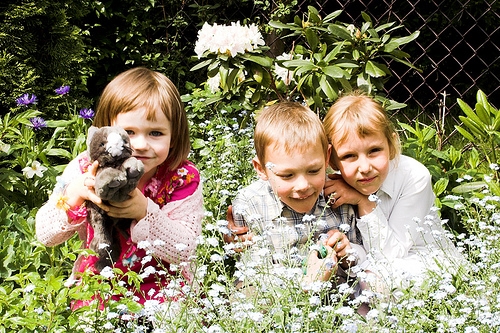

In [63]:
print('Test 3A - Greedy')
image, rid = image_cap_predict(eval_type='greedy', rid=2966)
# opening the image, does not work inside the function
Image.open(image)

Test 3B - Beam=3
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
Evaulation method   : beam
Real Caption        : three kids <unk> with a toy cat in a garden
Prediction Caption  : two girls have
BELU score          : 0
time took to Predict: 1 sec
image id            : 2966


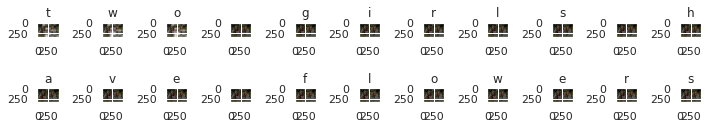

Test 3C - Beam=6
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
Evaulation method   : beam
Real Caption        : three kids <unk> with a toy cat in a garden
Prediction Caption  : two
BELU score          : 0
time took to Predict: 3 sec
image id            : 2966


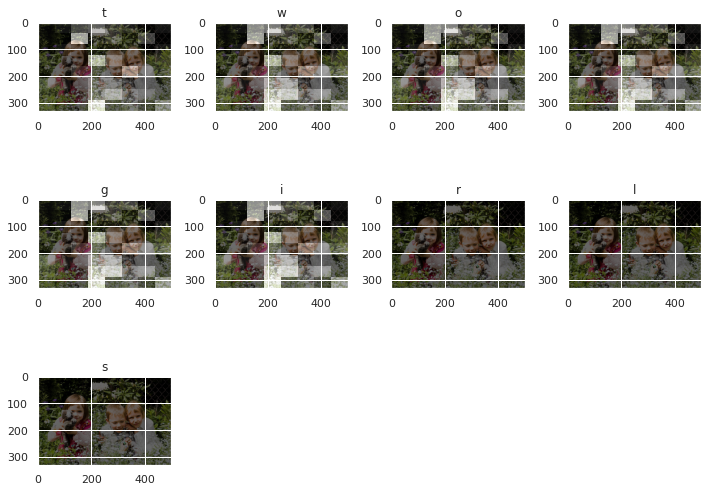

Test 3D - Beam=10
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
Evaulation method   : beam
Real Caption        : three kids <unk> with a toy cat in a garden
Prediction Caption  : two girls have fell being for a
BELU score          : 24.622082007735305
time took to Predict: 7 sec
image id            : 2966


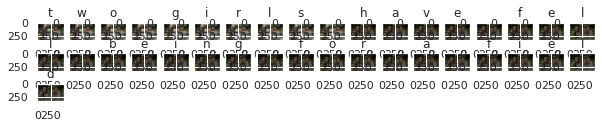

In [64]:
print('Test 3B - Beam=3')
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=2966)

print('Test 3C - Beam=6')
image, rid = image_cap_predict(eval_type='beam', beam_index=6, rid=2966)

print('Test 3D - Beam=10')
image, rid = image_cap_predict(eval_type='beam', beam_index=10, rid=2966)

# opening the image, does not work inside the function
#Image.open(image)